# Quail data #

Can I get spatial correlations using PIV techniques?

## Load libraries ##

In [1]:
from openpiv import tools, pyprocess, validation, filters, scaling 

import numpy as np
import matplotlib.pyplot as plt

import imageio
import os

from skimage import io

In [2]:
%matplotlib inline

In [3]:
!pwd

/Users/jwhite/Library/Mobile Documents/com~apple~CloudDocs/Science/GrillLab/Projects/quail


## Test frames ##

Do I get anything reasonable?

In [100]:
frame_100 = tools.imread('data/slice_100.tif')
frame_101 = tools.imread('data/slice_101.tif')

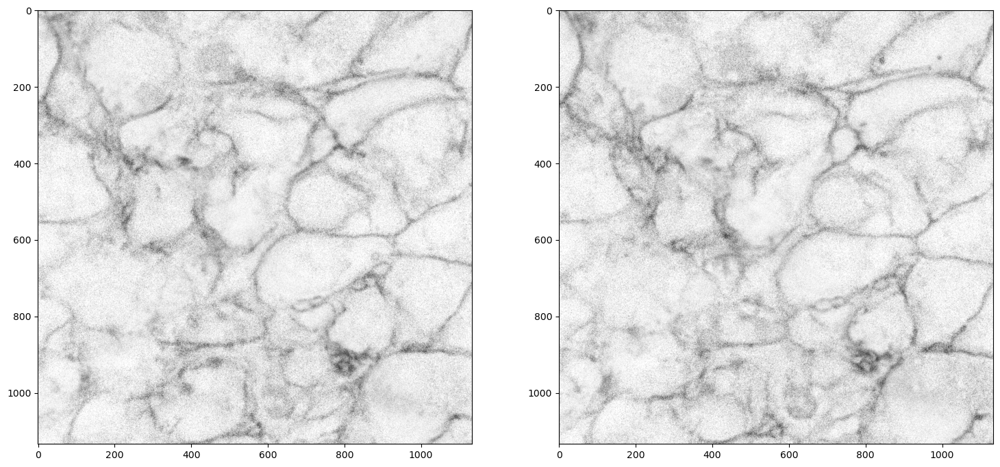

In [5]:
fig,ax = plt.subplots(1,2,figsize=(18,12))
ax[0].imshow(frame_100,cmap=plt.cm.gray_r)
ax[1].imshow(frame_101,cmap=plt.cm.gray_r);

In [6]:
winsize = 32 # pixels, interrogation window size in frame A
searchsize = 38  # pixels, search in image B
overlap = 12 # pixels, 50% overlap
dt = 1 # sec, time interval between pulses


u0, v0, sig2noise = pyprocess.extended_search_area_piv(frame_100.astype(np.int32), 
                                                       frame_101.astype(np.int32), 
                                                       window_size=winsize, 
                                                       overlap=overlap, 
                                                       dt=dt, 
                                                       search_area_size=searchsize, 
                                                       sig2noise_method='peak2peak')

In [7]:
x, y = pyprocess.get_coordinates(image_size       = frame_100.shape, 
                                 search_area_size = searchsize, 
                                 overlap          = overlap )

In [8]:
u1, v1, mask = validation.sig2noise_val( u0, v0,
                                        sig2noise, 
                                        threshold = 1.05 )

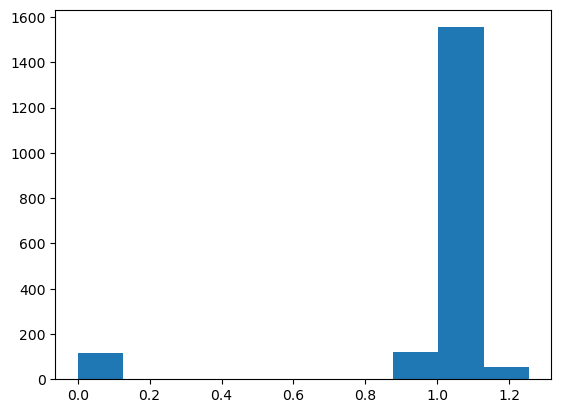

In [9]:
plt.hist(sig2noise.flatten());

In [10]:
mask

array([[False,  True,  True, ...,  True, False, False],
       [False,  True, False, ...,  True,  True,  True],
       [ True,  True, False, ..., False,  True,  True],
       ...,
       [ True,  True, False, ..., False,  True,  True],
       [ True,  True, False, ...,  True,  True,  True],
       [ True,  True,  True, ..., False,  True,  True]])

In [11]:
#save in the simple ASCII table format
tools.save(x, y, u1, v1, mask, 'data/slice_100to101_u1v1.txt' )

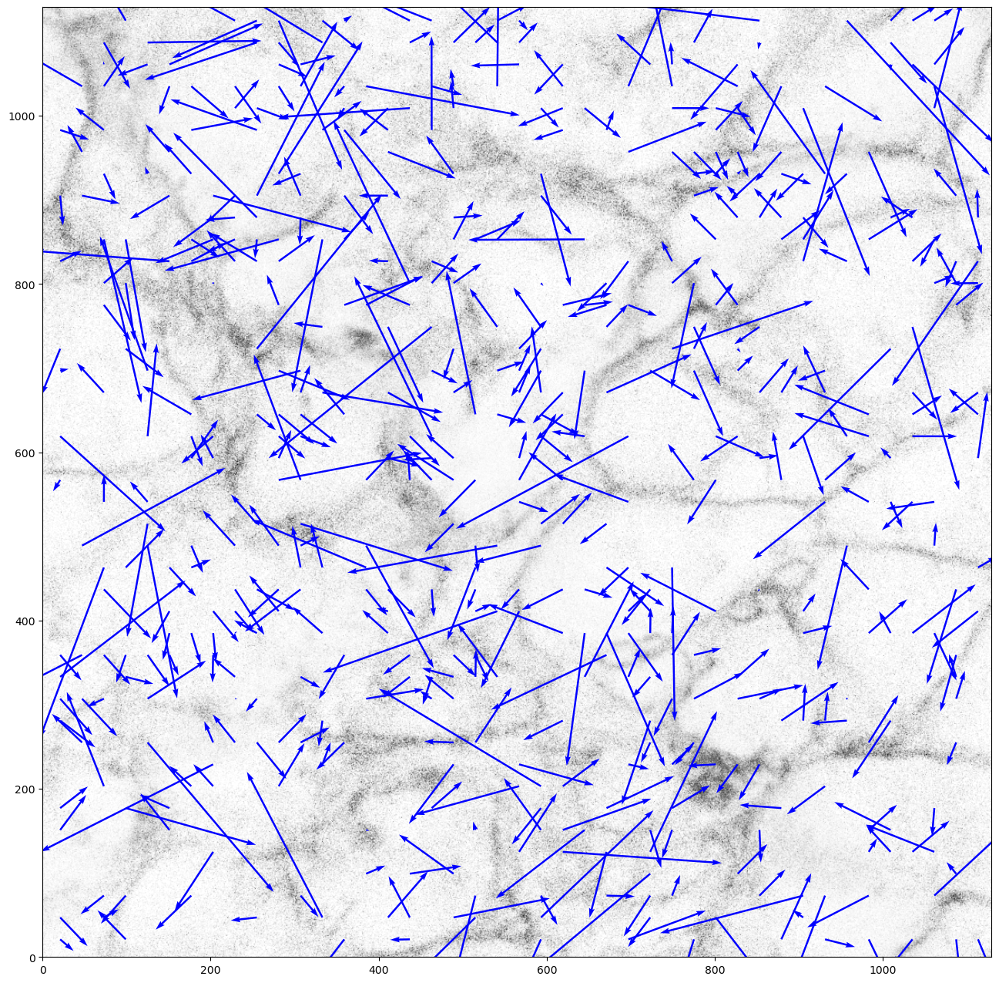

In [12]:
fig, ax = plt.subplots(figsize=(16,16))
tools.display_vector_field('data/slice_100to101_u1v1.txt',
                           ax=ax,
                           # scaling_factor=1, 
                           scale=100, # scale defines here the arrow length
                           width=0.002, # width is the thickness of the arrow
                           on_img=True, # overlay on the image
                           # on_img=False, # overlay on the image
                           image_name='data/slice_100.tif');

In [13]:
# filter out outliers that are very different from the
# neighbours

u2, v2 = filters.replace_outliers( u1, v1, 
                                  method='localmean', 
                                  max_iter=3, 
                                  kernel_size=3)

In [14]:
#save in the simple ASCII table format
tools.save(x, y, u2, v1, mask, 'data/slice_100to101_u2v2.txt' )

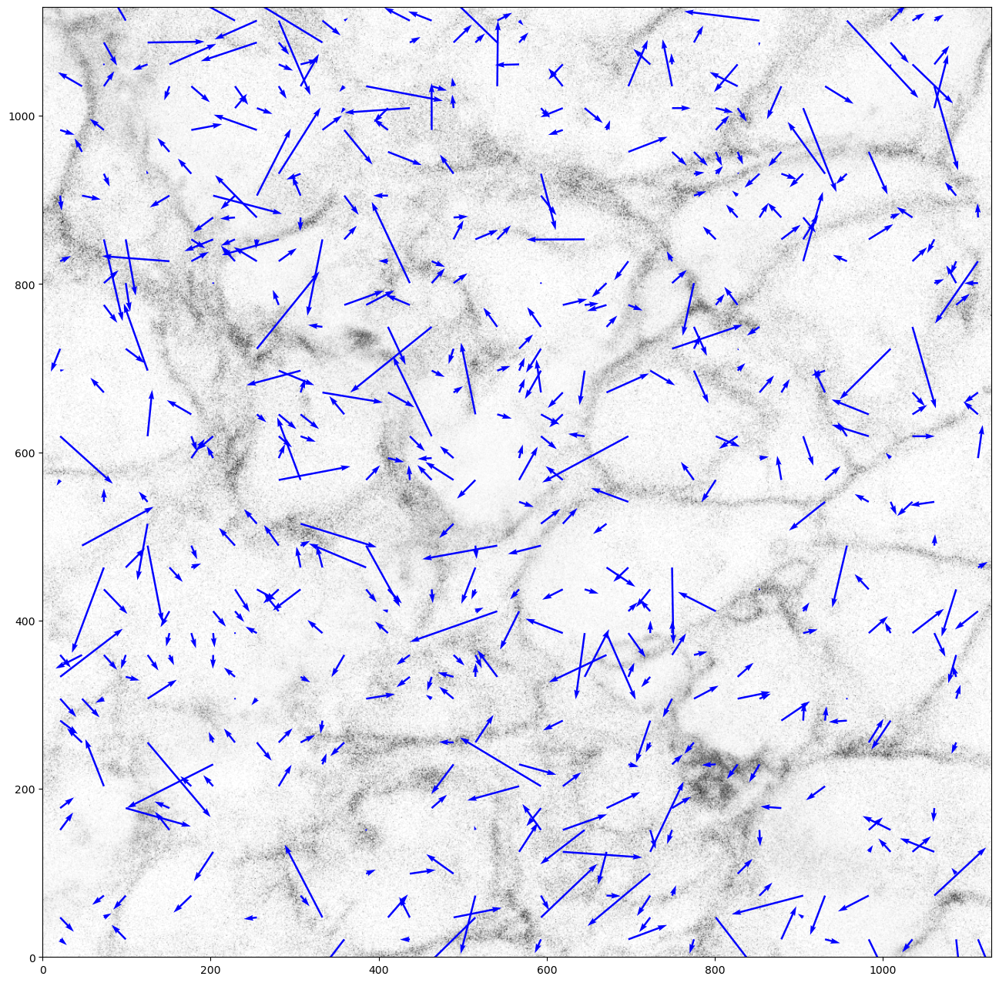

In [15]:
fig, ax = plt.subplots(figsize=(16,16))
tools.display_vector_field('data/slice_100to101_u2v2.txt',
                           ax=ax,
                           # scaling_factor=1, 
                           scale=200, # scale defines here the arrow length
                           width=0.002, # width is the thickness of the arrow
                           on_img=True, # overlay on the image
                           # on_img=False, # overlay on the image
                           image_name='data/slice_100.tif');

In [16]:
# convert x,y to mm
# convert u,v to mm/sec

x, y, u3, v3 = scaling.uniform(x, y, u2, v2, 
                               # scaling_factor = 96.52,
                               scaling_factor=1,
                              ) # 96.52 microns/pixel

# 0,0 shall be bottom left, positive rotation rate is counterclockwise
x, y, u3, v3 = tools.transform_coordinates(x, y, u3, v3)

In [25]:
u3[0]

array([ 1.40676972, -0.31374066, -0.58086049, -2.97755885, -1.60055581,
       -1.94964386, -2.3879439 , -2.71765537, -2.63508638, -2.78181011,
       -2.65926423, -2.16466301, -1.72147911, -6.068252  , -0.76330759,
       -0.44656551, -2.06931347, -0.03927894,  0.13053327,  0.47545339,
        1.06123294,  1.34365737, -1.29667843,  2.45998559,  1.58922598,
        1.5891522 ,  8.15859917,  1.21576022,  1.16742038, -0.91756373,
        0.78825228,  0.76103755,  0.46577894,  3.15061633, -0.71918595,
        3.16348871, -1.10085271,  2.84443779, -0.10762308, -2.16684229,
        0.59681585,  1.95149956,  3.18343373])

In [26]:
#save in the simple ASCII table format
tools.save(x, y, u3, v3, mask, 'data/slice_100to101_u3v3.txt' )

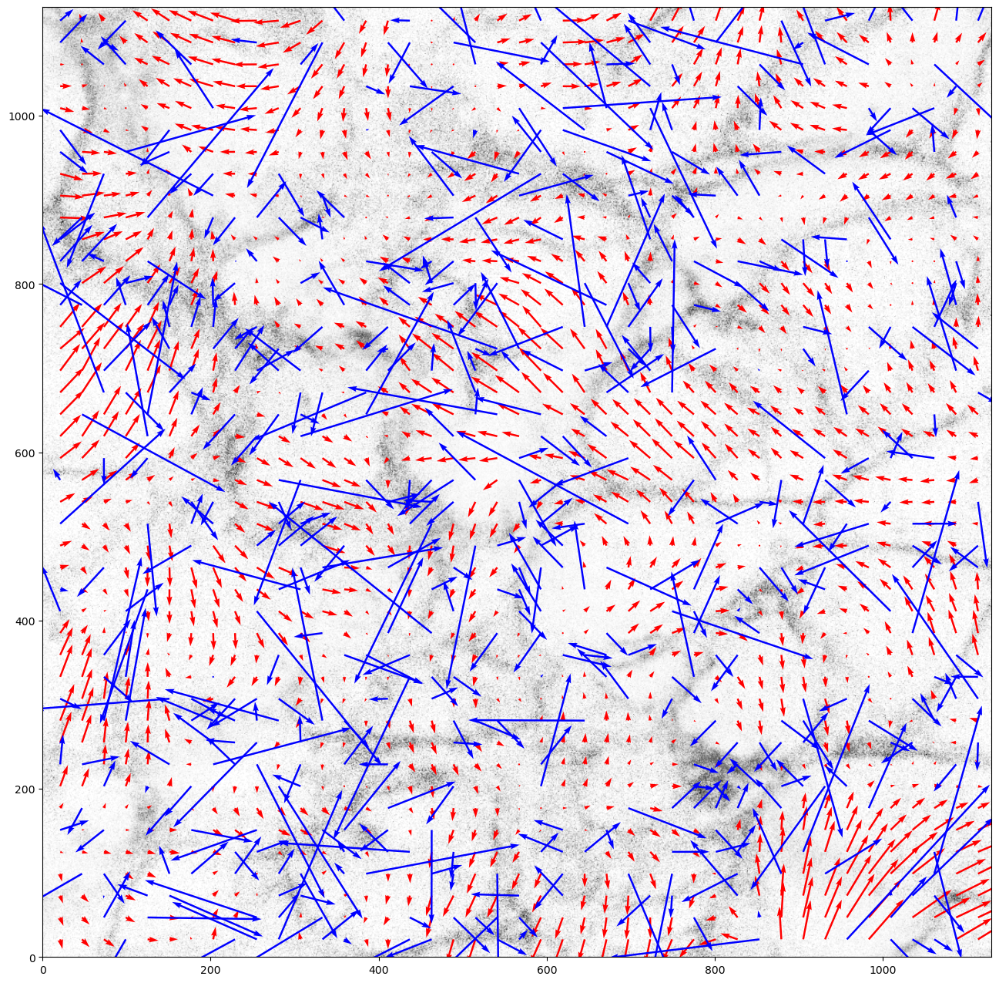

In [64]:
fig, ax = plt.subplots(figsize=(16,16))
tools.display_vector_field('data/slice_100to101_u3v3.txt',
                           ax=ax,
                           # scaling_factor=1, 
                           scale=100, # scale defines here the arrow length
                           width=0.002, # width is the thickness of the arrow
                           on_img=True, # overlay on the image
                           # on_img=False, # overlay on the image
                           image_name='data/slice_100.tif');

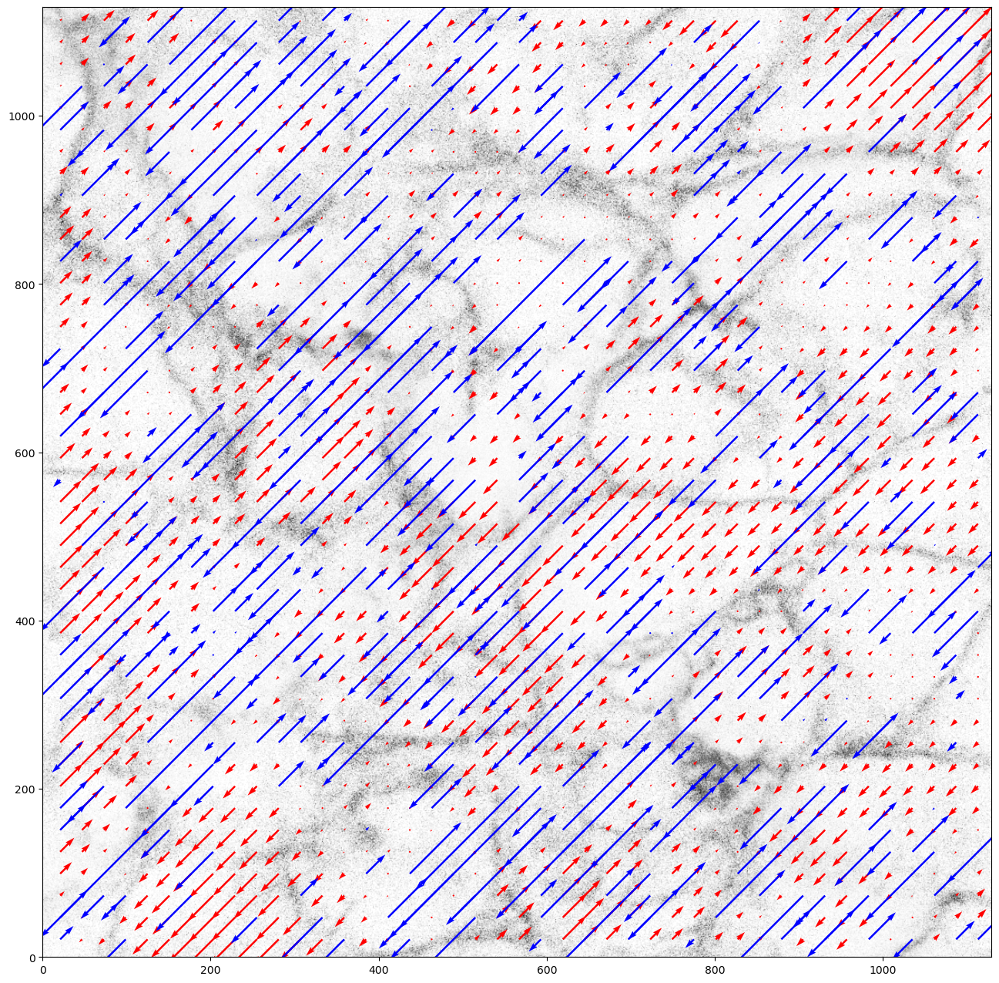

In [110]:
fig, ax = plt.subplots(figsize=(16,16))
tools.display_vector_field('data/piv/crop_small_piv_0001.txt',
                           ax=ax,
                           # scaling_factor=1, 
                           scale=100, # scale defines here the arrow length
                           width=0.002, # width is the thickness of the arrow
                           on_img=True, # overlay on the image
                           # on_img=False, # overlay on the image
                           image_name='data/slice_100.tif');

## Pairwise comparison of frames ##

In [28]:
winsize = 32 # pixels, interrogation window size in frame A
searchsize = 38  # pixels, search in image B
overlap = 12 # pixels, 50% overlap
dt = 1 # sec, time interval between pulses

In [29]:
stack = io.imread('data/node_crop_small.tif')

In [30]:
stack.shape

(181, 1134, 1134)

In [31]:
type(stack)

numpy.ndarray

In [96]:
image_size = stack[0].shape
image_size

(1134, 1134)

In [104]:
frame_100_from_stack = stack[100]
frame_101_from_stack = stack[101]
frame_100_from_stack

array([[25, 61, 78, ..., 35, 53, 34],
       [38, 45, 75, ..., 32, 46, 31],
       [30, 30, 29, ..., 29, 28, 17],
       ...,
       [ 2, 11, 23, ..., 31, 29, 47],
       [ 0,  6,  1, ..., 52, 29, 57],
       [ 0,  0,  0, ..., 54, 60, 36]], dtype=uint8)

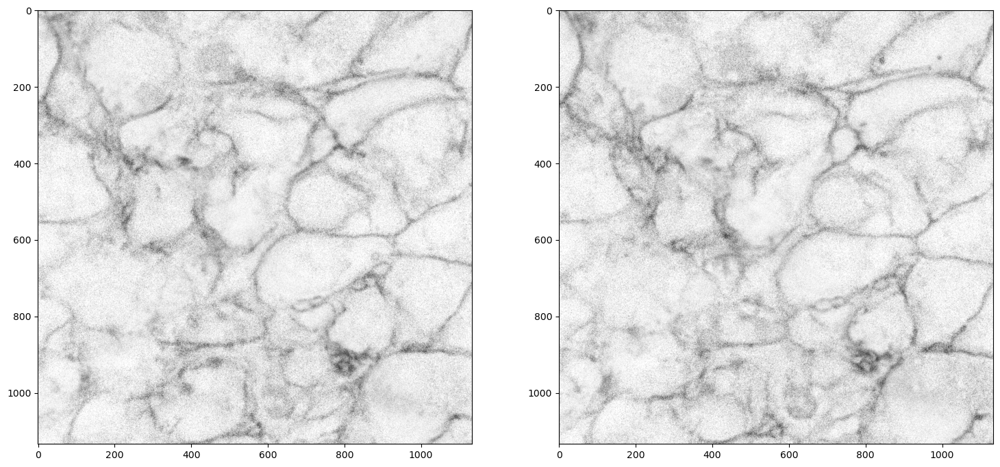

In [103]:
fig,ax = plt.subplots(1,2,figsize=(18,12))
ax[0].imshow(frame_100,cmap=plt.cm.gray_r)
ax[1].imshow(frame_101,cmap=plt.cm.gray_r);

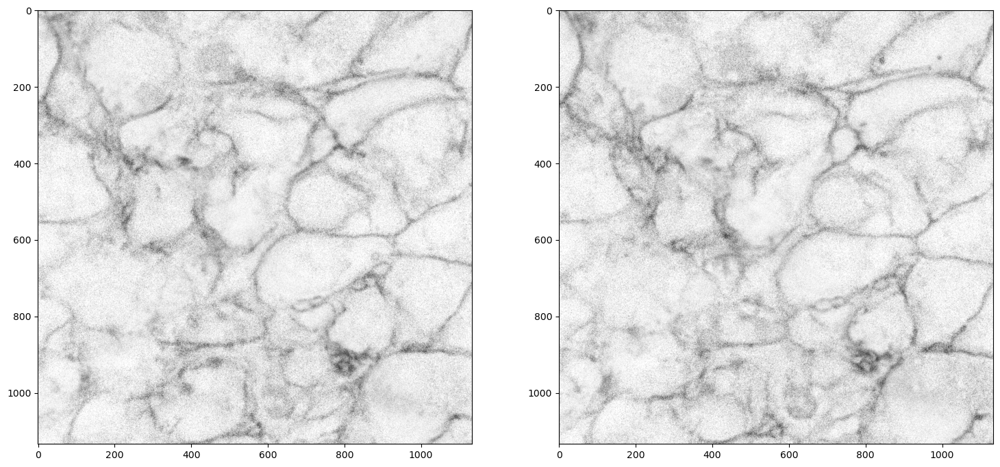

In [105]:
fig,ax = plt.subplots(1,2,figsize=(18,12))
ax[0].imshow(frame_100_from_stack,cmap=plt.cm.gray_r)
ax[1].imshow(frame_101_from_stack,cmap=plt.cm.gray_r);

In [33]:
x, y = pyprocess.get_coordinates(
    
    image_size       = image_size,
    search_area_size = searchsize,
    overlap          = overlap,
)

In [109]:
vector_list_u = []
vector_list_v = []
# for i in range(len(stack[100:101])):
# for i in range(len(stack)-1):
for i in [1]:
    
    # frame_a = stack[i]
    # frame_b = stack[i+1]
    frame_a = frame_100_from_stack
    frame_b = frame_101_from_stack
    
    u0,v0, sig2noise = pyprocess.extended_search_area_piv(
        frame_a.astype(np.int32), 
        frame_b.astype(np.int32),
        window_size=winsize,
        overlap=overlap,
        dt=dt,
        search_area_size=searchsize,
        sig2noise_method='peak2peak')
    
    u1, v1, mask = validation.sig2noise_val( 
        u0, v0,
        sig2noise,
        threshold = 1.05 
    )
    
    # filter out outliers that are very different from the neighbours
    u2, v2 = filters.replace_outliers( 
        u1, v1, 
        method='localmean', 
        max_iter=3, 
        kernel_size=3
    )
    x, y, u3, v3 = scaling.uniform(
        x, y, u2, v2, 
        scaling_factor=1,
    )

    # 0,0 shall be bottom left, positive rotation rate is counterclockwise
    x, y, u3, v3 = tools.transform_coordinates(x, y, u3, v3)
    tools.save(x, y, u3, u3, mask, f'data/piv/crop_small_piv_{i:04}.txt' )
    
    vector_list_u.append(u3)
    vector_list_v.append(v3)

In [44]:
u = np.array(vector_list_u)
v = np.array(vector_list_v)

In [59]:
u.shape

(10, 43, 43)

## Look at mean flow through stack ##

In [48]:
avg_u = u.mean(axis=0)
avg_v = v.mean(axis=0)

In [50]:
x.shape
y.shape
avg_u.shape
avg_v.shape

(43, 43)

In [51]:
tools.save(x, y, avg_u, avg_v, mask, 'data/crop_small_piv.txt' )

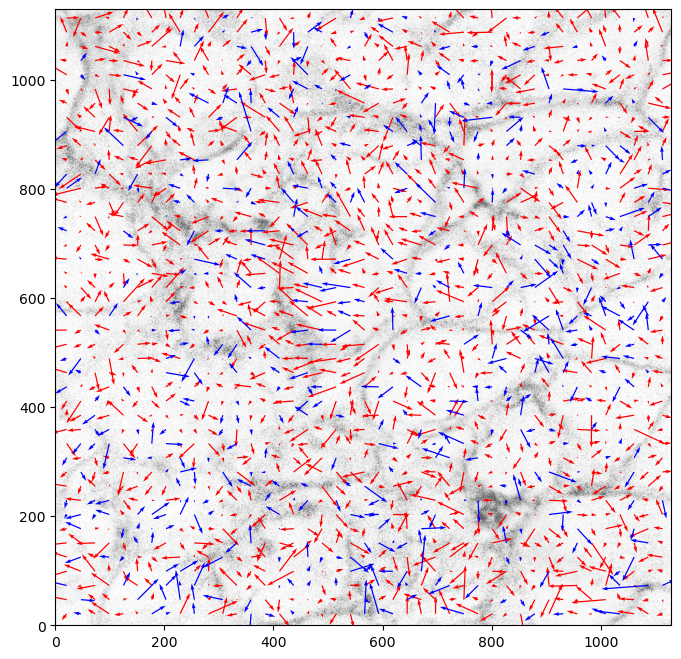

In [93]:
fig, ax = plt.subplots(figsize=(8,8))
tools.display_vector_field('data/crop_small_piv.txt',
                           ax=ax,
                           # scaling_factor=1, 
                           scale=100, # scale defines here the arrow length
                           width=0.002, # width is the thickness of the arrow
                           on_img=True, # overlay on the image
                           # on_img=False, # overlay on the image
                           image_name='data/slice_100.tif');

## Compare frame by frame ##

In [94]:
files = sorted(os.listdir('data/piv/'))
files[:10]

['crop_small_piv_0000.txt']

**** 0000 ****


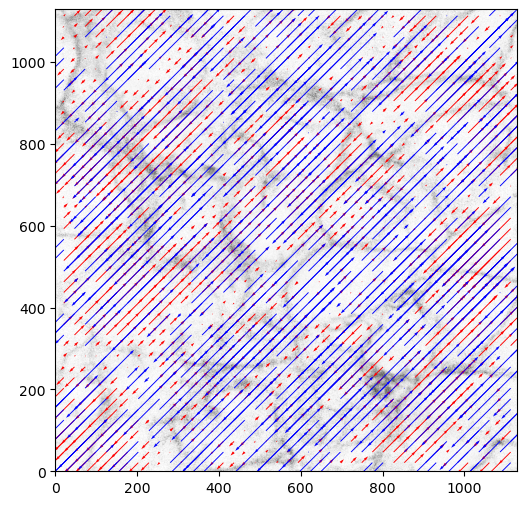

In [95]:
i=0
for file in files:
    print(f'**** {i:04} ****')
    fig, ax = plt.subplots(figsize=(6,6))
    tools.display_vector_field(f'data/piv/{file}',
                           ax=ax,
                           # scaling_factor=1, 
                           scale=100, # scale defines here the arrow length
                           width=0.002, # width is the thickness of the arrow
                           on_img=True, # overlay on the image
                           # on_img=False, # overlay on the image
                           image_name='data/slice_100.tif');
    i+=1
